# Exploración de datos

In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
from functools import reduce

project_path = os.path.abspath('../..')
sys.path.insert(1, project_path)

import pandas as pd
import numpy as np
from scipy.stats import circmean

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")

from src.utils import get_project_root
from src.data.make_dataset import get_minma_data
from src.visualization.trends import visualizar_trends
from src.visualization.eda import *
from src.visualization.clustering import *

## EDA - {datos}

### Carga de datos 

In [2]:
params = ['SO2','NO2', 'NO', 'NOX', 'O3'] # NO HAY CO
ma_params =['velviento', 'dirviento'] #no hay temp
from_last = '5y'
ventanas_df = get_minma_data(params, 'ventanas', from_last=from_last)

cols_to_drop = list(ventanas_df.filter(regex='(?<!no validados)_.*')) 
ventanas_df = ventanas_df.drop(cols_to_drop, axis=1)
ventanas_df = ventanas_df.rename(columns={"Registros no validados_SO2": "SO2_V", "Registros no validados_NO2": "NO2_V", "Registros no validados_NO": "NO_V", "Registros no validados_NOX": "NOX_V", "Registros no validados_O3": "O3_V", "Registros no validados_CO": "CO_V"})
#pd.read_excel(get_project_root() / 'data' / 'raw' / 'CEMS industrial datos Quintero.xlsx', header=2, index_col=0)

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/443522449.py:4: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  ventanas_df = get_minma_data(params, 'ventanas', from_last=from_last)


In [3]:
ma_v_df = get_minma_data(ma_params, 'ventanas', from_last=from_last, n_cols = 3)
ma_v_df = ma_v_df.rename(columns={"Unnamed: 2_velviento": "VelViento_V", "Unnamed: 2_temp": "Temperatura_V", "Unnamed: 2_dirviento": "DirViento_V"})
ventanas_df = ventanas_df.join(ma_v_df)

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/2805385771.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  ma_v_df = get_minma_data(ma_params, 'ventanas', from_last=from_last, n_cols = 3)


In [4]:
ventanas_df

,SO2_V,NO2_V,NO_V,NOX_V,O3_V,VelViento_V,DirViento_V
2017-10-04 18:00:00,2.31,4.54,2.05393,6.50358,15.0,NaN,NaN
2017-10-04 19:00:00,2.12,3.65,1.63730,5.28568,16.0,NaN,NaN
2017-10-04 20:00:00,2.15,3.59,1.64193,5.22860,17.0,NaN,NaN
2017-10-04 21:00:00,2.01,3.40,1.67473,5.07702,16.0,NaN,NaN
2017-10-04 22:00:00,2.11,3.40,1.62698,5.02203,16.0,NaN,NaN
...,...,...,...,...,...,...,...
2022-10-04 19:00:00,1.46,2.99,1.86067,4.85557,14.0,0.795789,10.4054
2022-10-04 20:00:00,1.47,3.73,1.43493,5.16561,13.0,0.820491,23.8554
2022-10-04 21:00:00,1.43,4.40,1.50767,5.90353,10.0,1.088380,39.3150
2022-10-04 22:00:00,1.42,4.23,1.53685,5.76197,10.0,0.909185,43.3428


In [5]:
params = ['SO2','NO2', 'NO', 'NOX', 'O3']
ma_params =['velviento', 'dirviento'] #no hay temp
from_last = '5y'
quintero_df = get_minma_data(params, 'quintero', from_last=from_last)

cols_to_drop = list(quintero_df.filter(regex='(?<!no validados)_.*')) 
quintero_df = quintero_df.drop(cols_to_drop, axis=1)
quintero_df = quintero_df.rename(columns={"Registros no validados_SO2": "SO2_Q", "Registros no validados_NO2": "NO2_Q", "Registros no validados_NO": "NO_Q", "Registros no validados_NOX": "NOX_Q", "Registros no validados_O3": "O3_Q", "Registros no validados_CO": "CO_Q"})

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/3257785607.py:4: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  quintero_df = get_minma_data(params, 'quintero', from_last=from_last)


In [6]:
ma_q_df = get_minma_data(ma_params, 'quintero', from_last=from_last, n_cols = 3)
ma_q_df = ma_q_df.rename(columns={"Unnamed: 2_velviento": "VelViento_Q", "Unnamed: 2_temp": "Temperatura_Q", "Unnamed: 2_dirviento": "DirViento_Q"})
quintero_df = quintero_df.join(ma_q_df)

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/1707301999.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  ma_q_df = get_minma_data(ma_params, 'quintero', from_last=from_last, n_cols = 3)


In [7]:
quintero_df

,SO2_Q,NO2_Q,NO_Q,NOX_Q,O3_Q,VelViento_Q,DirViento_Q
2017-09-06 18:00:00,2.76,2.96,2.05297,4.93210,25.0,NaN,NaN
2017-09-06 19:00:00,2.86,2.91,1.93715,4.77287,26.0,NaN,NaN
2017-09-06 20:00:00,3.17,3.72,2.11827,5.74518,26.0,NaN,NaN
2017-09-06 21:00:00,3.92,5.31,3.17362,8.35487,20.0,NaN,NaN
2017-09-06 22:00:00,12.87,10.46,5.06924,15.28560,7.0,NaN,NaN
...,...,...,...,...,...,...,...
2022-09-06 19:00:00,2.21,6.98,1.35353,8.33331,36.0,0.411269,187.124
2022-09-06 20:00:00,2.25,5.50,1.30148,6.80131,39.0,0.772137,283.470
2022-09-06 21:00:00,2.27,4.48,1.19537,5.67241,39.0,1.537940,295.175
2022-09-06 22:00:00,2.30,3.92,1.09673,5.01439,39.0,2.368110,289.107


In [8]:
params = ['SO2','NO2', 'NO', 'NOX', 'O3', 'CO'] # NO HAY CO
ma_params =['velviento', 'dirviento'] #no hay temp
from_last = '5y'
maitenes_df = get_minma_data(params, 'maitenes', from_last=from_last)

cols_to_drop = list(maitenes_df.filter(regex='(?<!no validados)_.*')) 
maitenes_df = maitenes_df.drop(cols_to_drop, axis=1)
maitenes_df = maitenes_df.rename(columns={"Registros no validados_SO2": "SO2_M", "Registros no validados_NO2": "NO2_M", "Registros no validados_NO": "NO_M", "Registros no validados_NOX": "NOX_M", "Registros no validados_O3": "O3_M", "Registros no validados_CO": "CO_M"})

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/896129660.py:4: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  maitenes_df = get_minma_data(params, 'maitenes', from_last=from_last)


In [9]:
ma_m_df = get_minma_data(ma_params, 'maitenes', from_last=from_last, n_cols = 3)
ma_m_df = ma_m_df.rename(columns={"Unnamed: 2_velviento": "VelViento_M", "Unnamed: 2_temp": "Temperatura_M", "Unnamed: 2_dirviento": "DirViento_M"})
maitenes_df = maitenes_df.join(ma_m_df)

C:\Users\javie\AppData\Local\Temp/ipykernel_18220/108530062.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  ma_m_df = get_minma_data(ma_params, 'maitenes', from_last=from_last, n_cols = 3)


In [10]:
maitenes_df.head()

,SO2_M,NO2_M,NO_M,NOX_M,O3_M,CO_M,VelViento_M,DirViento_M
2017-09-06 18:00:00,3.22,2.16,2.01888,4.18258,21.0,0.22,NaN,NaN
2017-09-06 19:00:00,3.58,3.25,2.20725,5.46078,18.0,0.25,NaN,NaN
2017-09-06 20:00:00,7.39,13.01,2.41338,15.42390,9.0,0.29,NaN,NaN
2017-09-06 21:00:00,6.40,12.33,2.38637,14.72000,10.0,0.28,NaN,NaN
2017-09-06 22:00:00,4.77,7.22,2.31295,9.53500,13.0,0.27,NaN,NaN


In [11]:
data_df = quintero_df.join(maitenes_df.join(ventanas_df))

### Data info

In [12]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43830 entries, 2017-09-06 18:00:00 to 2022-09-06 23:00:00
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SO2_Q        43354 non-null  float64
 1   NO2_Q        43257 non-null  float64
 2   NO_Q         43311 non-null  float64
 3   NOX_Q        43311 non-null  float64
 4   O3_Q         43324 non-null  float64
 5   VelViento_Q  43715 non-null  float64
 6   DirViento_Q  43713 non-null  float64
 7   SO2_M        43346 non-null  float64
 8   NO2_M        43114 non-null  float64
 9   NO_M         42863 non-null  float64
 10  NOX_M        43211 non-null  float64
 11  O3_M         43337 non-null  float64
 12  CO_M         42863 non-null  float64
 13  VelViento_M  43546 non-null  float64
 14  DirViento_M  43546 non-null  float64
 15  SO2_V        42642 non-null  float64
 16  NO2_V        42553 non-null  float64
 17  NO_V         42558 non-null  float64
 18  NOX_V      

In [13]:
data_df

,SO2_Q,NO2_Q,NO_Q,NOX_Q,O3_Q,VelViento_Q,DirViento_Q,SO2_M,NO2_M,NO_M,...,CO_M,VelViento_M,DirViento_M,SO2_V,NO2_V,NO_V,NOX_V,O3_V,VelViento_V,DirViento_V
2017-09-06 18:00:00,2.76,2.96,2.05297,4.93210,25.0,NaN,NaN,3.22,2.16,2.01888,...,0.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-06 19:00:00,2.86,2.91,1.93715,4.77287,26.0,NaN,NaN,3.58,3.25,2.20725,...,0.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-06 20:00:00,3.17,3.72,2.11827,5.74518,26.0,NaN,NaN,7.39,13.01,2.41338,...,0.29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-06 21:00:00,3.92,5.31,3.17362,8.35487,20.0,NaN,NaN,6.40,12.33,2.38637,...,0.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-06 22:00:00,12.87,10.46,5.06924,15.28560,7.0,NaN,NaN,4.77,7.22,2.31295,...,0.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-06 19:00:00,2.21,6.98,1.35353,8.33331,36.0,0.411269,187.124,1.72,4.45,2.63838,...,0.25,0.337853,50.0185,1.22,6.21,2.11077,8.31882,20.0,0.606613,274.307
2022-09-06 20:00:00,2.25,5.50,1.30148,6.80131,39.0,0.772137,283.470,1.73,4.00,2.39560,...,0.24,0.311452,263.7750,1.25,4.01,1.84083,5.85289,22.0,1.422890,306.295
2022-09-06 21:00:00,2.27,4.48,1.19537,5.67241,39.0,1.537940,295.175,1.76,3.71,2.62483,...,0.23,0.770528,287.4050,1.22,3.59,1.38862,4.98067,22.0,0.741166,281.347
2022-09-06 22:00:00,2.30,3.92,1.09673,5.01439,39.0,2.368110,289.107,1.73,4.26,2.49475,...,0.20,1.069310,267.3580,1.20,2.72,1.44902,4.16917,23.0,2.568740,281.557


In [14]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43830 entries, 2017-09-06 18:00:00 to 2022-09-06 23:00:00
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SO2_Q        43354 non-null  float64
 1   NO2_Q        43257 non-null  float64
 2   NO_Q         43311 non-null  float64
 3   NOX_Q        43311 non-null  float64
 4   O3_Q         43324 non-null  float64
 5   VelViento_Q  43715 non-null  float64
 6   DirViento_Q  43713 non-null  float64
 7   SO2_M        43346 non-null  float64
 8   NO2_M        43114 non-null  float64
 9   NO_M         42863 non-null  float64
 10  NOX_M        43211 non-null  float64
 11  O3_M         43337 non-null  float64
 12  CO_M         42863 non-null  float64
 13  VelViento_M  43546 non-null  float64
 14  DirViento_M  43546 non-null  float64
 15  SO2_V        42642 non-null  float64
 16  NO2_V        42553 non-null  float64
 17  NO_V         42558 non-null  float64
 18  NOX_V      

### Visualización inicial

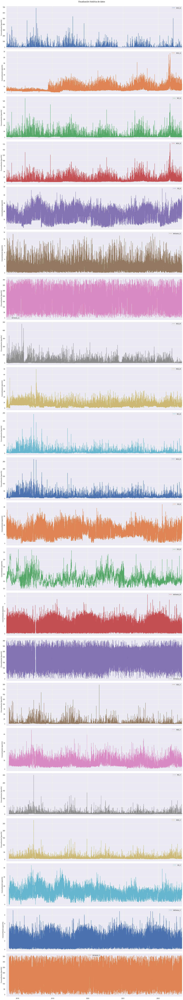

In [15]:
# ylabel_list -> label en eje y para cada variable
series_plot(data_df,
            ylabel_list=['Concentracion [ppm/hr]']*data_df.shape[1])

### Datos nulos

In [16]:
data_df.isna().sum()

SO2_Q           476
NO2_Q           573
NO_Q            519
NOX_Q           519
O3_Q            506
VelViento_Q     115
DirViento_Q     117
SO2_M           484
NO2_M           716
NO_M            967
NOX_M           619
O3_M            493
CO_M            967
VelViento_M     284
DirViento_M     284
SO2_V          1188
NO2_V          1277
NO_V           1272
NOX_V          1275
O3_V           1210
VelViento_V     885
DirViento_V     885
dtype: int64

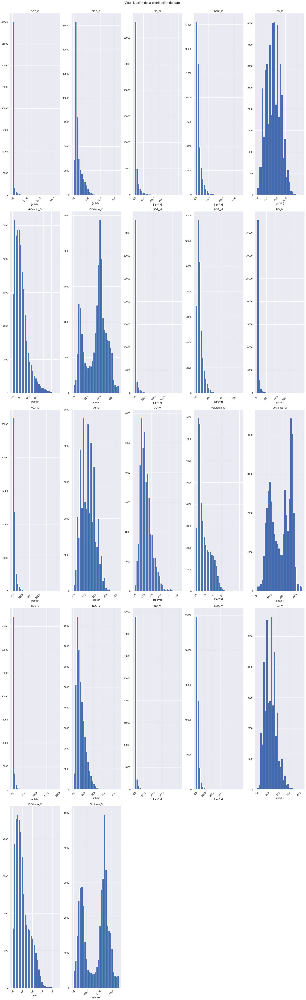

In [43]:
# xlabel_list -> label en eje x para cada variable
#args = {'xscale':'log', 'yscale':'log'} # -> Descomentar para aplica escala logaritmica 
hist_plot(data_df, xlabel_list=['[ppb/hr]']*(data_df.shape[1]-2) + ["m/s"] + ["grados"], n_rows = 5) #, **args) #-> Opcional para escala logaritmica, u otros parámetros

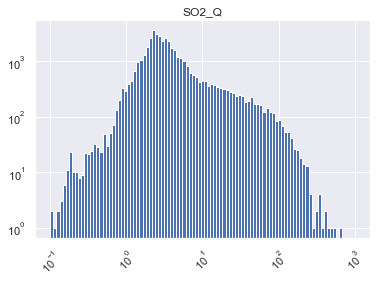

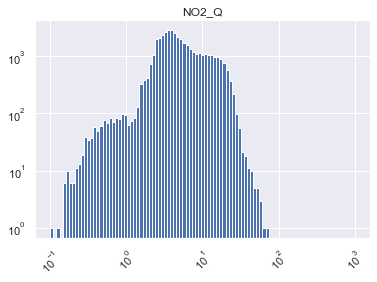

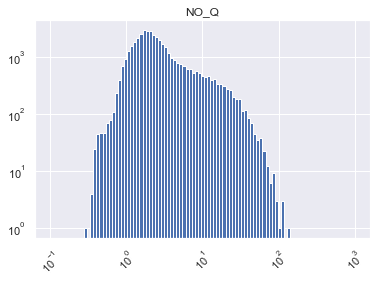

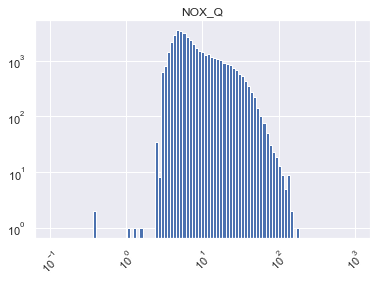

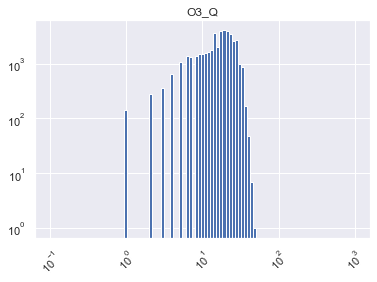

...

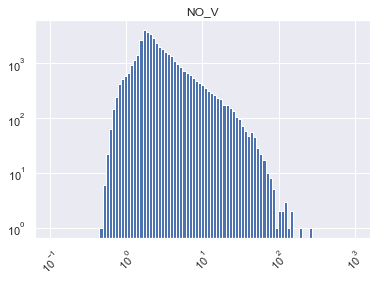

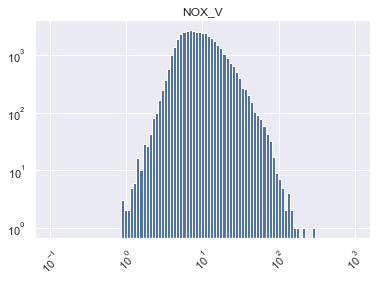

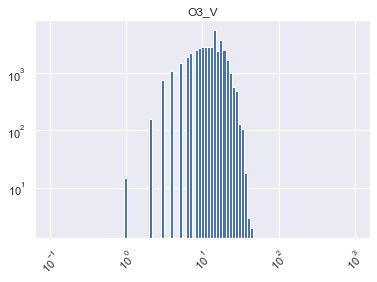

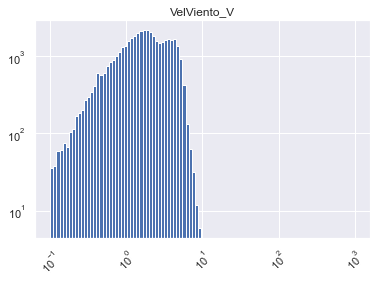

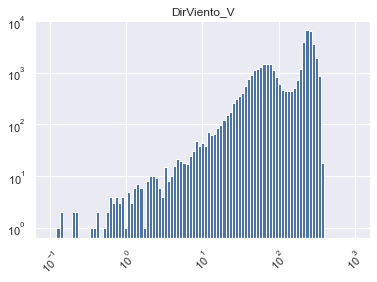

In [44]:
for col in data_df.columns:
    data_df.hist(col, bins = np.logspace(-1,3,100), log =True)
    #sns.countplot(concon_df[col])
    plt.title(col)
    plt.xscale("log")
    plt.xticks(rotation=45)
    plt.show()

### Resumen estadístico

In [46]:
data_df.describe()

,SO2_Q,NO2_Q,NO_Q,NOX_Q,O3_Q,VelViento_Q,DirViento_Q,SO2_M,NO2_M,NO_M,...,CO_M,VelViento_M,DirViento_M,SO2_V,NO2_V,NO_V,NOX_V,O3_V,VelViento_V,DirViento_V
count,43354.000000,43257.000000,43311.000000,43311.000000,43324.000000,43715.000000,43713.000000,43346.000000,43114.000000,42863.000000,...,42863.000000,43546.000000,43546.000000,42642.000000,42553.000000,42558.000000,42555.000000,42620.000000,42945.000000,42945.000000
mean,8.193720,6.651786,4.562043,11.124358,17.077601,2.237859,178.528549,9.014335,6.027903,5.107988,...,0.268700,0.923261,187.007584,4.448853,7.298181,4.067790,11.335674,12.848616,2.036899,176.055504
std,19.142225,5.415142,6.853160,10.755792,7.530616,1.675699,83.116527,18.902016,4.473848,8.268546,...,0.137349,0.725972,81.887885,6.291814,4.411576,6.161121,9.109534,5.606841,1.386725,97.070873
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.006325,0.073498,0.030000,0.000000,0.000000,...,0.000000,0.001232,0.015313,0.070000,0.170000,0.443233,0.902985,0.000000,0.009623,0.003069
25%,2.170000,3.130000,1.564640,4.905500,11.000000,1.008400,106.126000,1.960000,3.010000,1.943910,...,0.170000,0.348808,107.927250,2.300000,3.980000,1.698485,5.980635,9.000000,0.968357,70.924400
50%,3.040000,4.520000,2.238630,6.855780,17.000000,1.883360,200.513000,2.900000,4.890000,2.970230,...,0.240000,0.653004,201.995500,2.850000,6.170000,2.268275,8.772950,12.000000,1.677700,217.120000
75%,5.310000,8.440000,4.085390,13.054950,23.000000,2.977335,233.067000,5.840000,7.540000,4.641375,...,0.340000,1.411933,266.377750,4.130000,9.620000,3.843580,13.462450,16.000000,2.872940,252.296000
max,684.630000,67.380000,129.551000,179.154000,48.000000,11.606500,359.954000,480.250000,70.190000,243.155000,...,1.080000,5.212640,359.889000,199.110000,45.030000,251.305000,274.893000,43.000000,9.080660,359.959000


### Cantidad de datos por fecha

### Lag plots

#### 1 hora

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

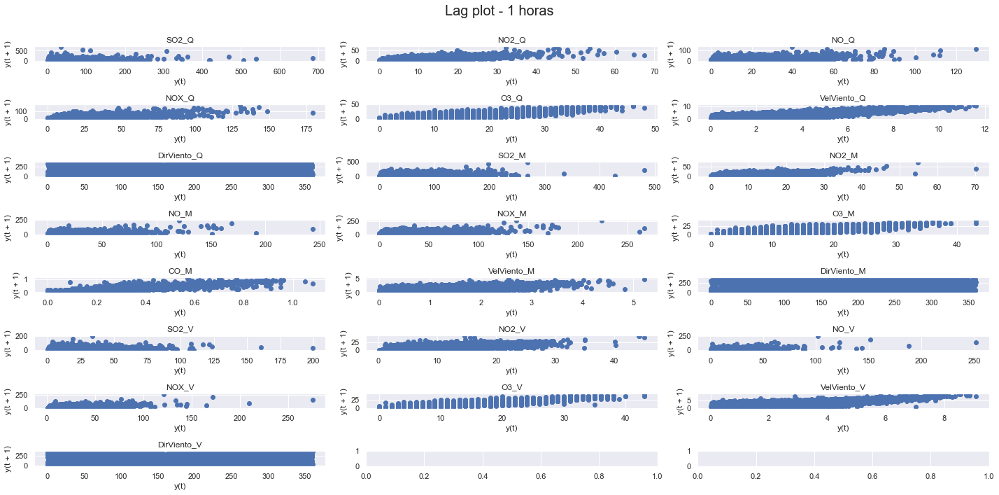

In [47]:
lag_plot(data_df, lag=1, unit='horas')

#### 1 día

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

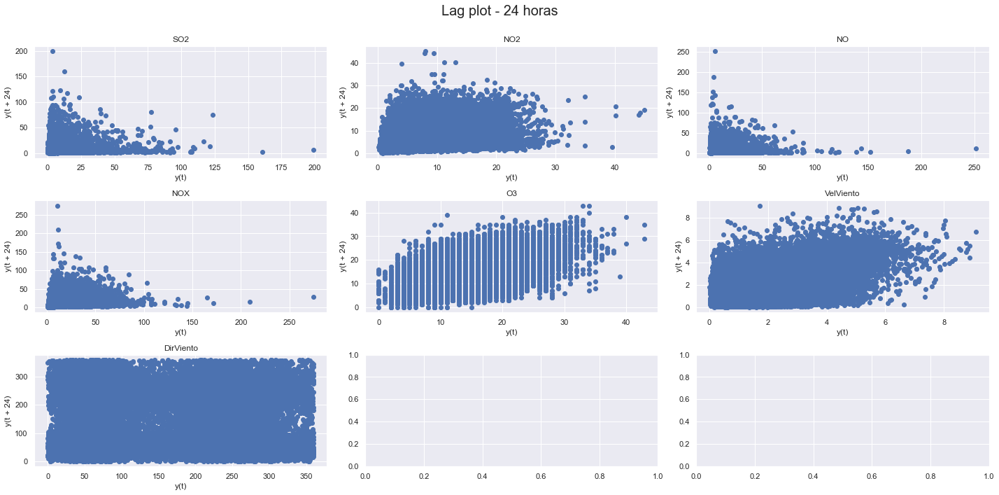

In [15]:
lag_plot(data_df, lag=24, unit='horas')

### Correlaciones entre datos

#### Pair plot

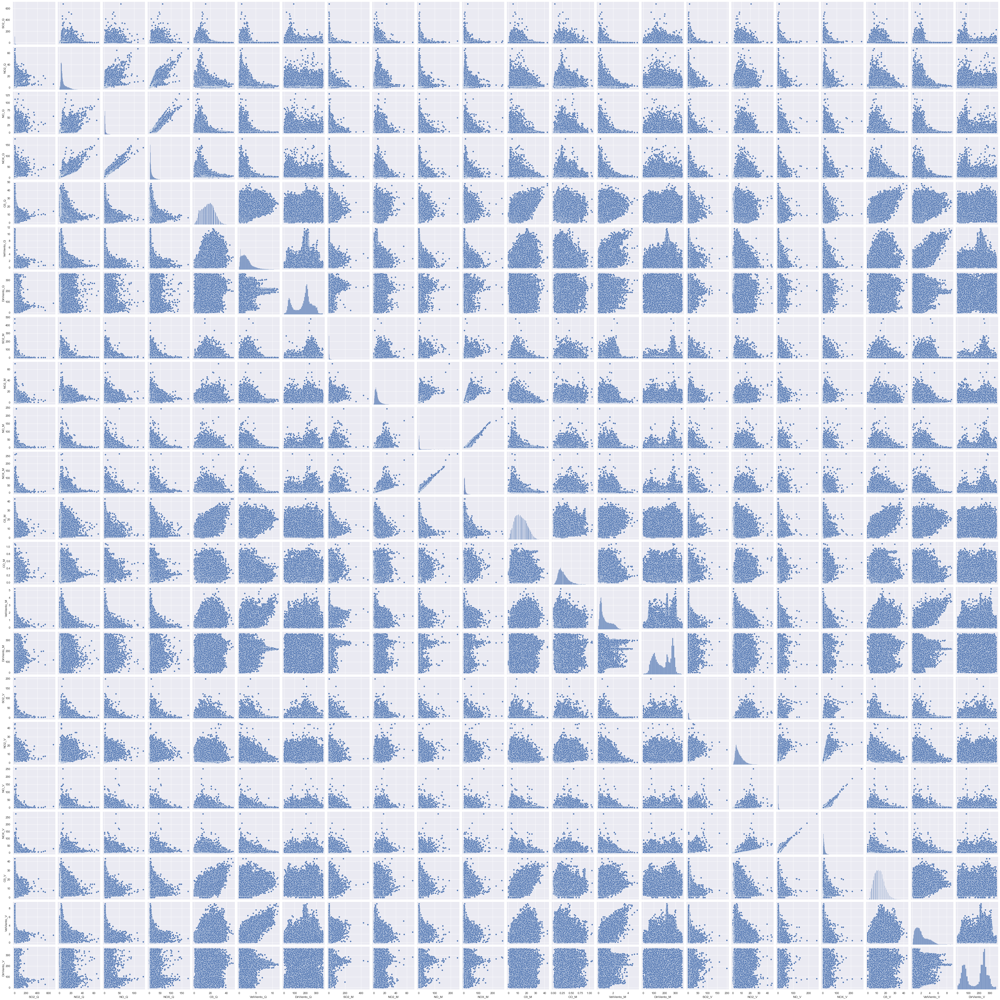

In [48]:
sns.pairplot(data_df)
plt.show()

#### Matriz de confusion

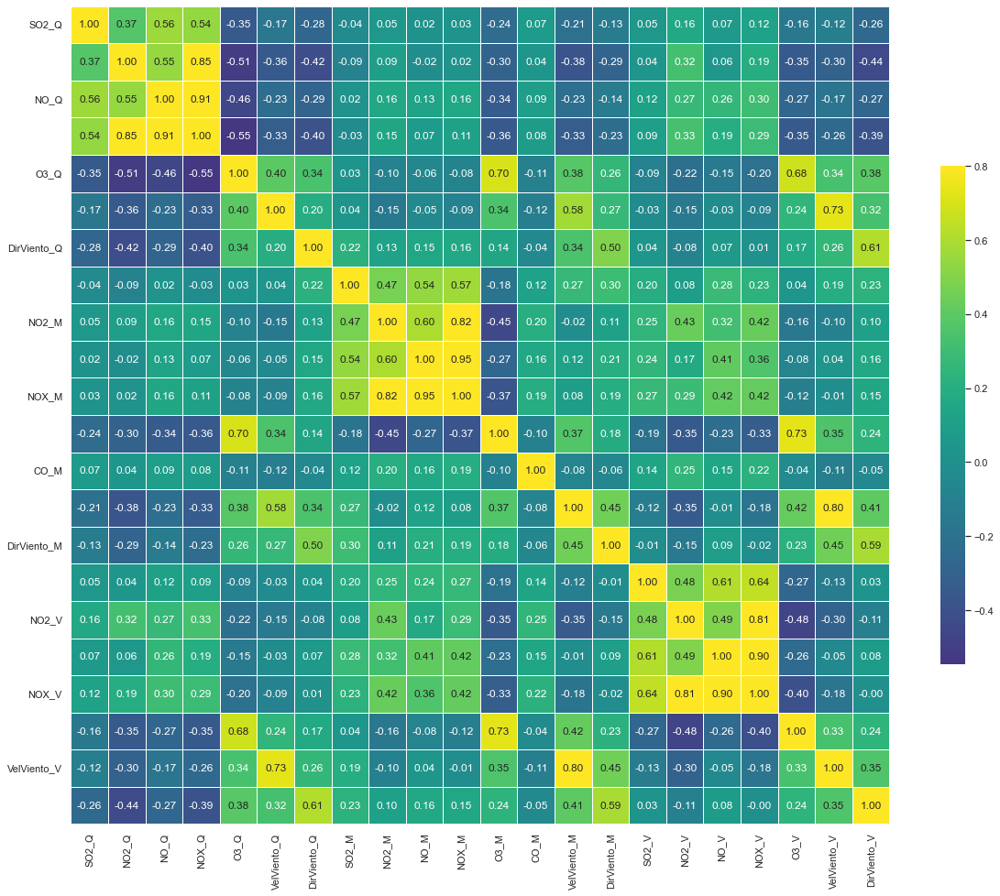

In [19]:
conf_matrix(data_df, size = (20, 20))

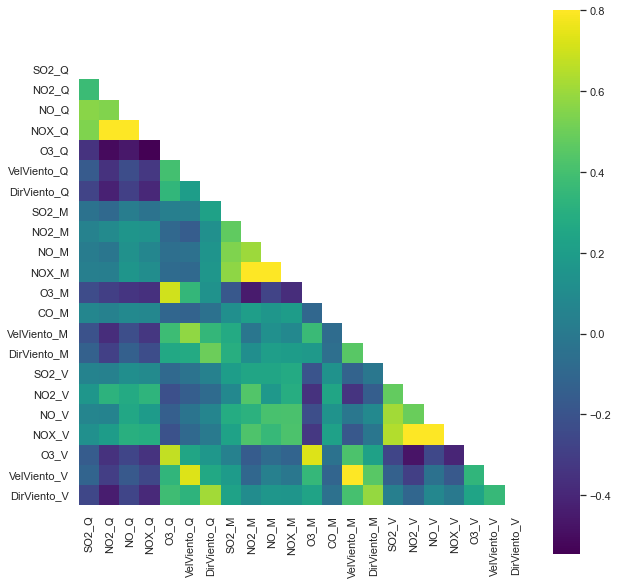

In [26]:
#corr = np.corrcoef(np.random.randn(10, 200))
corr = data_df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 10))
    ax = sns.heatmap(corr, mask=mask, vmax=.8, square=True, cmap = "viridis")

### Trends

In [27]:
chosen_col = "SO2_M"

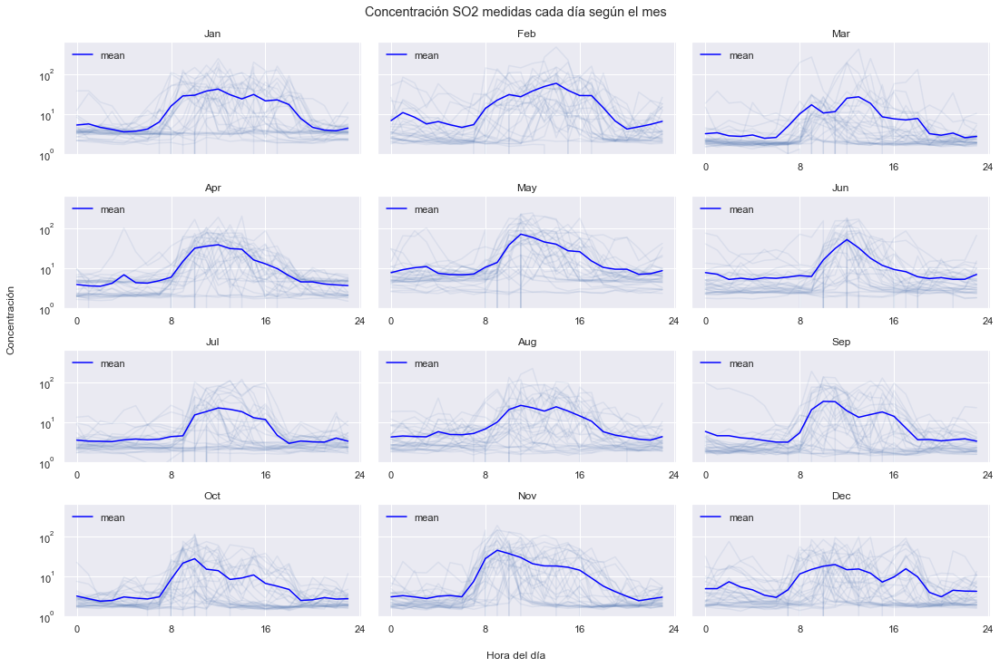

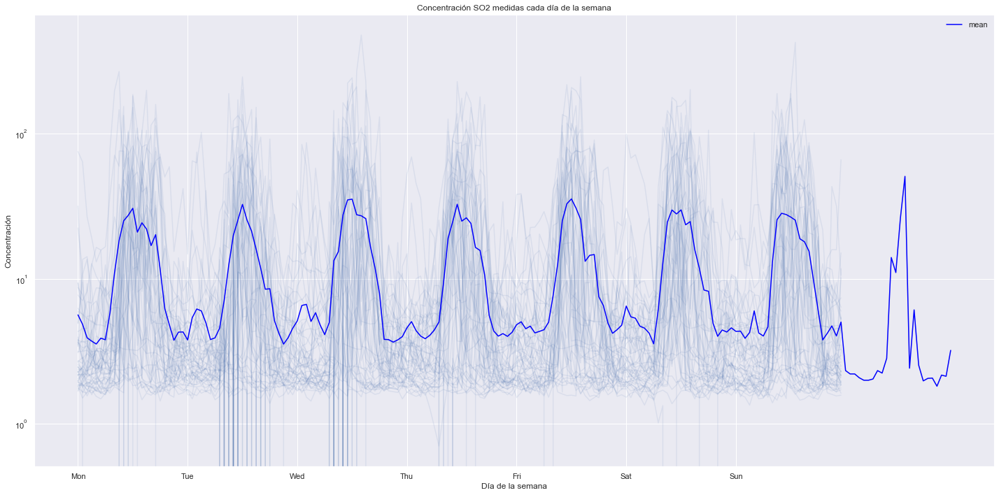

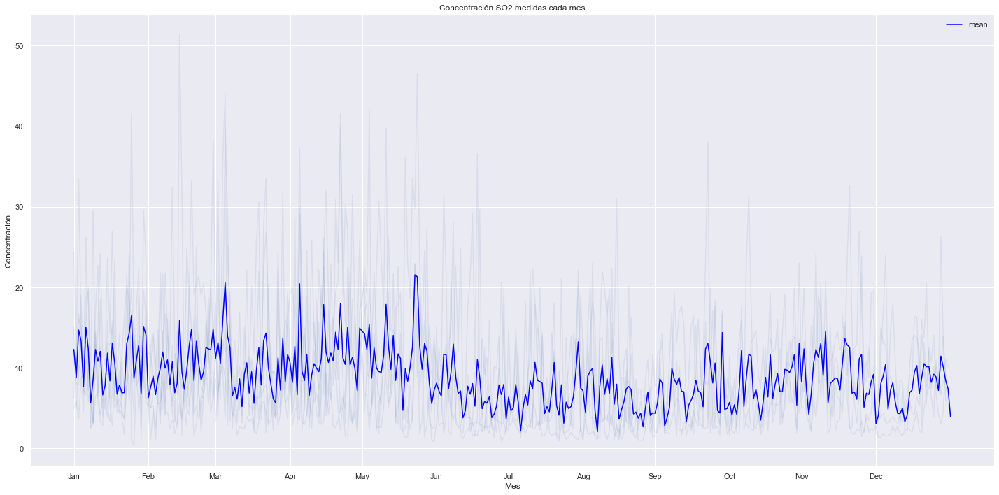

In [30]:
visualizar_trends(data_df, col = chosen_col, ano_0=2018, title='Concentración {}'.format(chosen_col[:-2]), log = True)

### Estadísticos por períodos

#### Anual

In [20]:
time_describe(data_df, col=chosen_col, res='y', from_date=data_df.index[0], to_date=data_df.index[-1], highlights=True)

#### Mensual

In [21]:
time_describe(data_df, col=chosen_col, res='m', from_date=data_df.index[0], to_date=data_df.index[-1])

SO2                                                        
     count      mean       std   min     25%   50%     75%     max
m                                                                 
01  3679.0  3.347336  3.139707  0.80  2.4250  2.76  3.3800   65.63
02  3347.0  3.366651  3.775317  0.73  1.5950  2.77  3.4000   83.20
03  3651.0  3.342720  3.984532  0.65  1.7000  2.61  3.2450   91.63
04  3568.0  4.024313  5.772193  0.70  1.7400  2.71  3.8800  199.11
05  3688.0  5.612893  7.377929  0.37  2.2900  3.17  6.0200  108.97
06  3566.0  5.388278  8.403052  0.35  1.8100  2.90  5.1900  121.42
07  3672.0  5.625648  8.251644  1.01  2.3275  3.12  5.4825  123.48
08  3655.0  5.449294  8.548037  0.75  2.0900  2.99  4.8250  107.63
09  3566.0  3.846113  5.916391  0.07  1.5600  2.69  3.4000  160.50
10  3668.0  4.976260  6.761011  0.08  2.6400  3.05  4.5700  106.74
11  3570.0  4.249218  5.134764  0.98  2.5500  2.95  4.2400  116.99
12  3680.0  3.535992  3.336019  0.88  2.4700  2.71  3.3600   56.57

#### Diario

In [22]:
time_describe(data_df, col=chosen_col, res='d', from_date=data_df.index[0], to_date=data_df.index[-1])

SO2                                                         
     count      mean       std   min     25%    50%     75%     max
d                                                                  
01  1433.0  4.488381  6.492010  0.73  2.2300  2.890  4.2700   85.18
02  1422.0  4.151090  5.792917  0.64  2.0600  2.890  3.8800   84.36
03  1431.0  4.914151  8.023462  0.59  2.3700  2.930  4.3800  160.50
04  1421.0  4.349937  6.007758  0.38  2.1500  2.840  4.0800   97.22
05  1422.0  4.135148  4.621150  0.07  2.1425  2.845  4.0600   46.39
06  1423.0  4.063914  5.752387  0.56  1.9900  2.750  3.5750   85.84
07  1415.0  4.350269  6.427128  0.75  2.0200  2.730  3.5750   69.58
08  1398.0  4.575987  7.029518  0.55  2.4200  2.880  4.0775  116.99
09  1415.0  4.375032  5.722285  0.49  2.4150  2.940  4.0600   77.28
10  1427.0  4.966973  7.630761  0.61  2.3050  2.850  4.2650   93.20
11  1415.0  4.705477  5.844040  0.48  2.3700  2.840  4.4650   73.07
12  1420.0  4.596331  6.261788  0.76  2.4500  2.880  4.3500   78.88
13  1426.0  4.500386  6.311741  0.75  2.3900  2.930  4.2275   86.44
14  1420.0  5.031676  7.477218  0.65  2.4000  2.920  4.6825  107.55
15  1422.0  3.874100  4.670769  0.74  1.8900  2.700  3.7000   70.95
16  1424.0  3.813237  4.954380  0.37  1.8700  2.780  3.7625  109.98
17  1428.0  4.341744  5.413610  0.10  2.2800  2.920  4.2625   67.80
18  1431.0  4.863746  7.980171  0.66  2.2800  2.800  4.3700  121.42
19  1424.0  4.177739  6.249498  0.29  2.3100  2.730  3.7000   93.51
20  1429.0  4.224822  5.094808  0.49  2.3700  2.830  4.0300   62.32
21  1427.0  4.240434  4.996438  0.64  2.3300  2.820  4.1850   72.25
22  1427.0  5.226636  8.384817  0.10  2.2350  2.840  4.5100  107.63
23  1431.0  4.305164  5.667146  0.08  2.1100  2.730  4.2100   77.78
24  1420.0  4.015852  5.598459  0.58  1.9975  2.740  3.6325   68.79
25  1425.0  4.664204  6.561613  0.73  2.0200  2.810  4.4300   82.12
26  1425.0  4.382744  6.290842  0.63  2.0700  2.770  4.1900   91.40
27  1435.0  4.271073  5.150571  0.71  2.0600  2.910  4.2350   53.39
28  1423.0  4.149951  6.886993  0.71  2.0250  2.840  3.8200  199.11
29  1317.0  4.311777  6.482872  0.83  2.3800  2.860  3.8600   94.15
30  1304.0  4.103267  4.790311  0.85  2.3675  2.930  4.0600   60.81
31   830.0  4.315651  6.667924  0.80  2.3350  2.895  4.0400  123.48

### Clustering

In [37]:
X_total, X_train, fechas = generate_data_clustering(data_df, chosen_col, years = [2018, 2019, 2021, 2022], window = [(1,1,2021), (12,12,2021)])

DBA KMeans
Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 345 out of 345 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.0s finished


245.788 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.0s finished


168.633 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished


167.163 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished


167.034 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished


167.034 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 345 out of 345 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished


259.045 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.0s finished


197.424 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.0s finished


197.307 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.0s finished


197.307 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1035 out of 1035 | elapsed:    0.1s finished


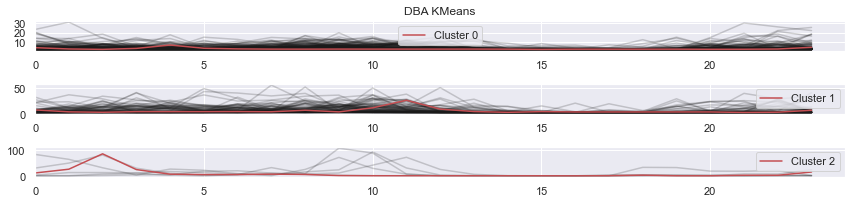

In [61]:
N_clusters = 3
#y_pred, km = test_clusterings(X_train, N_clusters, "Euclidean KMeans")
#y_pred, km = test_clusterings(X_train, N_clusters, "Soft-DTW KMeans")
y_pred, km = test_clusterings(X_train, N_clusters, "DBA KMeans")

In [62]:
#Las fechas de los eventos interesantes
fechas_interesantes = [(19,8,2018), (1,10,2019), (6,6,2022)]
ts_dias = [X_total[fechas[f]] for f in fechas_interesantes]

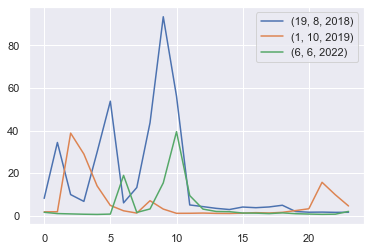

In [63]:
for i, s in enumerate(ts_dias):
    plt.plot(range(24), s, label = "{}".format(fechas_interesantes[i]))
plt.legend()
plt.show()

In [64]:
km.predict(ts_dias)

C:\Users\javie\anaconda3\lib\site-packages\tslearn\utils\utils.py:88: UserWarning: 2-Dimensional data passed. Assuming these are 3 1-dimensional timeseries
  warnings.warn('2-Dimensional data passed. Assuming these are '
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.0s finished


array([2, 1, 1], dtype=int64)